In [8]:
import torch
from transformers import AutoModelForVision2Seq, AutoProcessor
from peft import LoraConfig, get_peft_model
from torch.utils.data import DataLoader, Dataset, random_split
from torch.optim import AdamW
from PIL import Image
import os
import nltk
from nltk.translate.bleu_score import sentence_bleu
from tqdm import tqdm

nltk.download('punkt')

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [9]:
# 1. Set up the environment
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [10]:
captions_file = "/kaggle/input/captionjson/captions.json"
image_dir = "/kaggle/input/iamge-caption-dataset/train/images"

In [11]:
config = LoraConfig(
    r=16,
    lora_alpha=32,
    lora_dropout=0.05,
    bias="none",
    target_modules=[
        "self.query",
        "self.key",
        "self.value",
        "output.dense",
        "self_attn.qkv",
        "self_attn.projection",
        "mlp.fc1",
        "mlp.fc2",
    ],
)


In [12]:
model_id = "Salesforce/blip-image-captioning-base"
model = AutoModelForVision2Seq.from_pretrained(model_id).to(device)
processor = AutoProcessor.from_pretrained(model_id)

# Apply PEFT (LoRA)
model = get_peft_model(model, config)
model.print_trainable_parameters()

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

trainable params: 5,455,872 || all params: 252,869,948 || trainable%: 2.1576


In [13]:
import json
captions_dict = {}
with open(captions_file, 'r') as f:
    json_data = json.load(f)
    for item in tqdm(json_data, desc="Loading caption"):
        image_file = item["image_id"].split("/")[-1]  # Extract just filename
        caption = item["caption"]
        captions_dict[image_file] = caption

print("Total images loaded:", len(captions_dict))


Loading caption: 100%|██████████| 179/179 [00:00<00:00, 500186.82it/s]

Total images loaded: 179


In [14]:
class ImageCaptioningDataset(Dataset):
    def __init__(self, image_dir, captions_dict, processor):
        self.image_dir = image_dir
        self.captions_dict = captions_dict
        self.image_files = list(captions_dict.keys())
        self.processor = processor

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_file = self.image_files[idx]
        image_path = os.path.join(self.image_dir, image_file)
        image = Image.open(image_path).convert('RGB')
        caption = self.captions_dict[image_file]

        # Image processing
        encoding = self.processor(images=image, padding="max_length", return_tensors="pt")
        encoding = {k: v.squeeze() for k, v in encoding.items()}
        encoding["text"] = caption
        return encoding


In [15]:
def collate_fn(batch):
    processed_batch = {}
    for key in batch[0].keys():
        if key != "text":
            processed_batch[key] = torch.stack([example[key] for example in batch])
        else:
            text_inputs = processor.tokenizer(
                [example["text"] for example in batch], padding=True, return_tensors="pt"
            )
            processed_batch["input_ids"] = text_inputs["input_ids"]
            processed_batch["attention_mask"] = text_inputs["attention_mask"]
    return processed_batch

In [16]:
full_dataset = ImageCaptioningDataset(image_dir, captions_dict, processor)
dataloader = DataLoader(full_dataset, batch_size=8, shuffle=True, collate_fn=collate_fn)

In [17]:
sample = next(iter(dataloader))
print("Batch loaded successfully!")
print("Images:", sample["pixel_values"].shape)
print("Input IDs:", sample["input_ids"].shape)


Batch loaded successfully!
Images: torch.Size([8, 3, 384, 384])
Input IDs: torch.Size([8, 12])


In [18]:
from torch.utils.data import random_split

# Example ratios
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

total_size = len(full_dataset)

# Calculate sizes
train_size = int(train_ratio * total_size)
val_size = int(val_ratio * total_size)
test_size = total_size - train_size - val_size  # To ensure no leftover samples

# Split the dataset
train_dataset, val_dataset, test_dataset = random_split(full_dataset, [train_size, val_size, test_size])

print(f"Train size: {len(train_dataset)}")
print(f"Val size: {len(val_dataset)}")
print(f"Test size: {len(test_dataset)}")


Train size: 125
Val size: 26
Test size: 28


In [19]:
len(train_dataset), len(val_dataset),len(test_dataset)

(125, 26, 28)

In [20]:
from torch.utils.data import DataLoader

train_dataloader = DataLoader(train_dataset, shuffle=True, batch_size=10, collate_fn=collate_fn)
val_dataloader = DataLoader(val_dataset, batch_size=10, collate_fn=collate_fn)
test_dataloader = DataLoader(test_dataset, batch_size=10, collate_fn=collate_fn)


In [21]:
# Setup optimizer
optimizer = AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

PeftModel(
  (base_model): LoraModel(
    (model): BlipForConditionalGeneration(
      (vision_model): BlipVisionModel(
        (embeddings): BlipVisionEmbeddings(
          (patch_embedding): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
        )
        (encoder): BlipEncoder(
          (layers): ModuleList(
            (0-11): 12 x BlipEncoderLayer(
              (self_attn): BlipAttention(
                (dropout): Dropout(p=0.0, inplace=False)
                (qkv): lora.Linear(
                  (base_layer): Linear(in_features=768, out_features=2304, bias=True)
                  (lora_dropout): ModuleDict(
                    (default): Dropout(p=0.05, inplace=False)
                  )
                  (lora_A): ModuleDict(
                    (default): Linear(in_features=768, out_features=16, bias=False)
                  )
                  (lora_B): ModuleDict(
                    (default): Linear(in_features=16, out_features=2304, bias=False)
                  

In [22]:
train_losses = []
val_losses = []

model.train()
for epoch in range(20):
    print(f"Epoch {epoch + 1}/20")
    epoch_loss = 0

    # ---- Training Loop ----
    model.train()
    for batch in train_dataloader:
        input_ids = batch.pop("input_ids").to(device)
        pixel_values = batch.pop("pixel_values").to(device)
        attention_mask = batch.pop("attention_mask").to(device)

        outputs = model(
            input_ids=input_ids,
            pixel_values=pixel_values,
            labels=input_ids,
            attention_mask=attention_mask,
        )

        loss = outputs.loss

        if torch.isnan(loss):
            print("NaN detected in loss. Skipping batch.")
            continue

        epoch_loss += loss.item()
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

    avg_train_loss = epoch_loss / len(train_dataloader)
    train_losses.append(avg_train_loss)

    # ---- Validation Loop ----
    model.eval()
    val_epoch_loss = 0
    with torch.no_grad():
        for batch in val_dataloader:
            input_ids = batch.pop("input_ids").to(device)
            pixel_values = batch.pop("pixel_values").to(device)
            attention_mask = batch.pop("attention_mask").to(device)

            outputs = model(
                input_ids=input_ids,
                pixel_values=pixel_values,
                labels=input_ids,
                attention_mask=attention_mask,
            )

            val_epoch_loss += outputs.loss.item()

    avg_val_loss = val_epoch_loss / len(val_dataloader)
    val_losses.append(avg_val_loss)

    print(f"Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")

# Save the fine-tuned model
model.save_pretrained('/kaggle/working/LLM Projects/Finetuned_blip/caption')


Epoch 1/20
Train Loss: 3.4309 | Val Loss: 3.2055
Epoch 2/20
Train Loss: 2.8148 | Val Loss: 2.8998
Epoch 3/20
Train Loss: 2.4912 | Val Loss: 2.7838
Epoch 4/20
Train Loss: 2.2300 | Val Loss: 2.7396
Epoch 5/20
Train Loss: 1.8351 | Val Loss: 2.7223
Epoch 6/20
Train Loss: 2.1407 | Val Loss: 2.6600
Epoch 7/20
Train Loss: 1.7469 | Val Loss: 2.5804
Epoch 8/20
Train Loss: 1.8056 | Val Loss: 2.6299
Epoch 9/20
Train Loss: 1.7424 | Val Loss: 2.6032
Epoch 10/20
Train Loss: 1.7274 | Val Loss: 2.5815
Epoch 11/20
Train Loss: 1.7543 | Val Loss: 2.5900
Epoch 12/20
Train Loss: 1.7094 | Val Loss: 2.6045
Epoch 13/20
Train Loss: 1.6869 | Val Loss: 2.6498
Epoch 14/20
Train Loss: 1.6341 | Val Loss: 2.6409
Epoch 15/20
Train Loss: 1.5257 | Val Loss: 2.6721
Epoch 16/20
Train Loss: 1.6117 | Val Loss: 2.7204
Epoch 17/20
Train Loss: 1.5652 | Val Loss: 2.6947
Epoch 18/20
Train Loss: 1.6087 | Val Loss: 2.7071
Epoch 19/20
Train Loss: 1.6147 | Val Loss: 2.6970
Epoch 20/20
Train Loss: 1.3910 | Val Loss: 2.7259


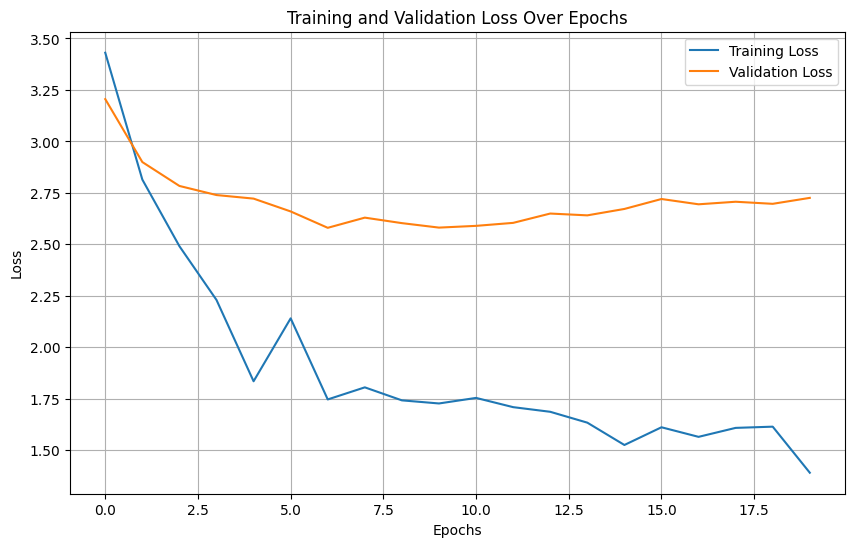

In [23]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()


In [24]:
# Training loop
model.train()
for epoch in range(20):  # Adjust the number of epochs as needed
    print(f"Epoch {epoch + 1}/{40}")
    epoch_loss = 0
    for batch in train_dataloader:
        input_ids = batch.pop("input_ids").to(device)
        pixel_values = batch.pop("pixel_values").to(device)
        attention_mask = batch.pop("attention_mask").to(device)

        outputs = model(
            input_ids=input_ids,
            pixel_values=pixel_values,
            labels=input_ids,
            attention_mask=attention_mask,
        )

        loss = outputs.loss
        # loss = loss  # Convert loss to torch.float32

        # Check for NaN in loss
        if torch.isnan(loss):
            print("NaN detected in loss. Skipping batch.")
            continue

        epoch_loss += loss.item()

        loss.backward()

        optimizer.step()
        optimizer.zero_grad()

    avg_loss = epoch_loss / len(train_dataloader)
    print(f"Average Loss for Epoch {epoch + 1}: {avg_loss:.4f}")

# Save the fine-tuned model
model.save_pretrained('/kaggle/working/LLM Projects/Finetuned_blip/caption')

Epoch 1/40
Average Loss for Epoch 1: 1.6128
Epoch 2/40
Average Loss for Epoch 2: 1.6522
Epoch 3/40
Average Loss for Epoch 3: 1.5681
Epoch 4/40
Average Loss for Epoch 4: 1.6616
Epoch 5/40
Average Loss for Epoch 5: 1.5857
Epoch 6/40
Average Loss for Epoch 6: 1.3755
Epoch 7/40
Average Loss for Epoch 7: 1.4655
Epoch 8/40
Average Loss for Epoch 8: 1.5463
Epoch 9/40
Average Loss for Epoch 9: 1.5530
Epoch 10/40
Average Loss for Epoch 10: 1.5066
Epoch 11/40
Average Loss for Epoch 11: 1.5829
Epoch 12/40
Average Loss for Epoch 12: 1.6157
Epoch 13/40
Average Loss for Epoch 13: 1.5664
Epoch 14/40
Average Loss for Epoch 14: 1.5161
Epoch 15/40
Average Loss for Epoch 15: 1.6672
Epoch 16/40
Average Loss for Epoch 16: 1.4797
Epoch 17/40
Average Loss for Epoch 17: 1.5126
Epoch 18/40
Average Loss for Epoch 18: 1.5913
Epoch 19/40
Average Loss for Epoch 19: 1.5155
Epoch 20/40
Average Loss for Epoch 20: 1.4938


In [25]:
model_path = '/kaggle/working/LLM Projects/Finetuned_blip/caption'
finetuned_model = AutoModelForVision2Seq.from_pretrained(model_path)
# processor = AutoProcessor.from_pretrained(model_id)

Generating captions with finetuned model and showing BLEU scores:


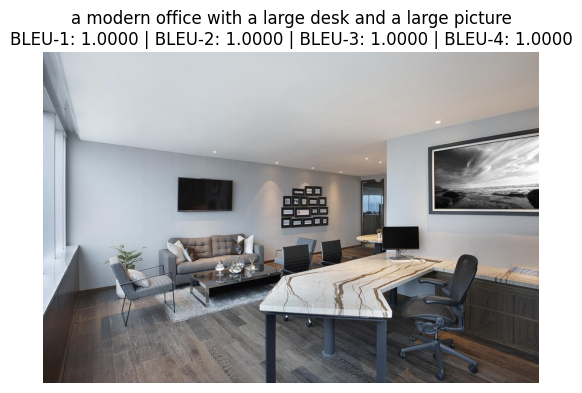

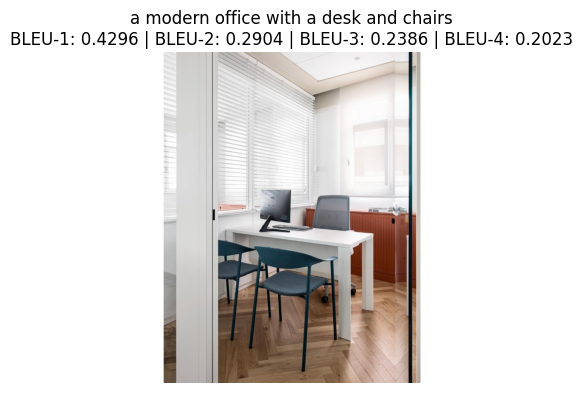

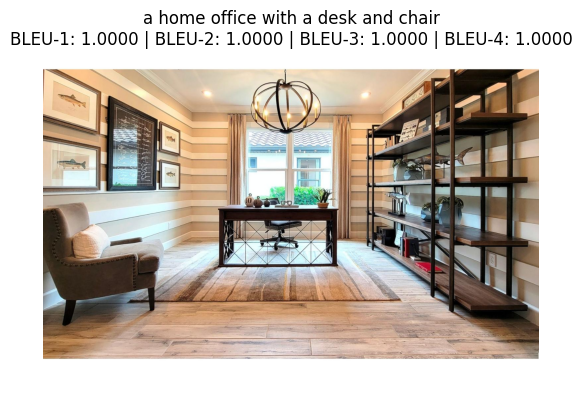

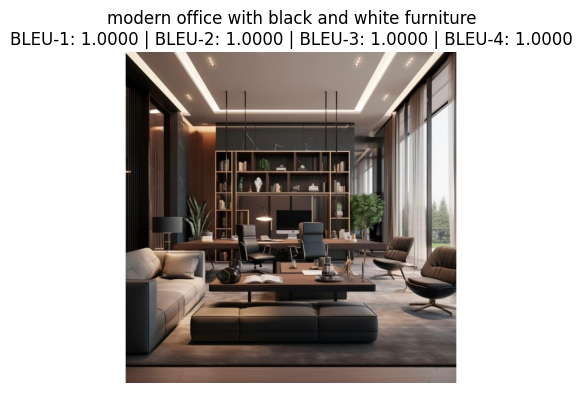

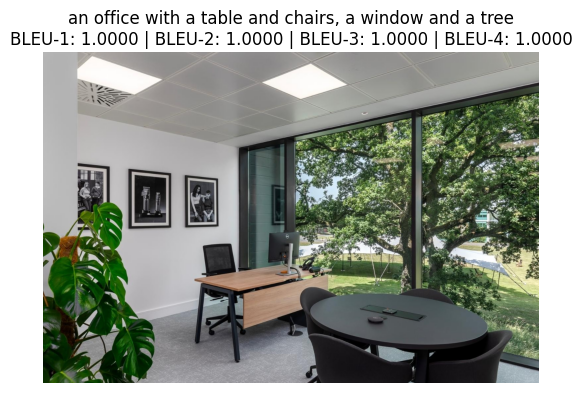

...

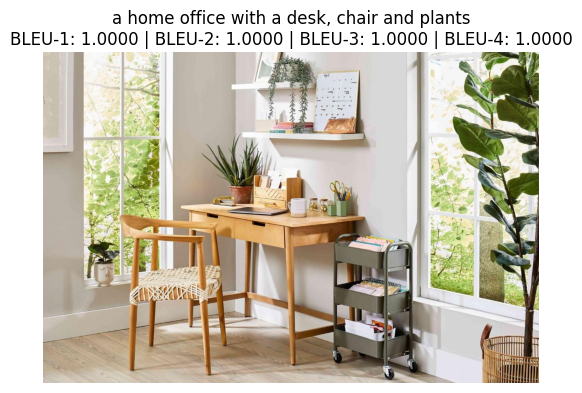

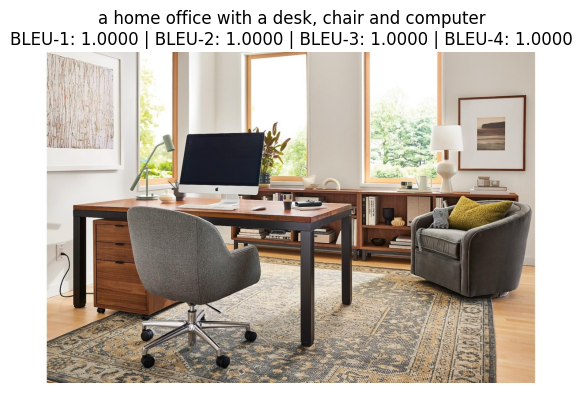

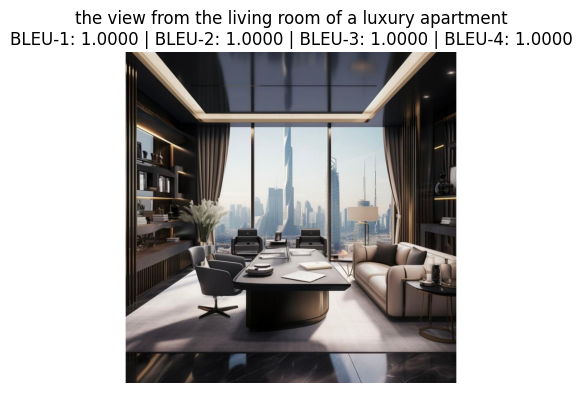

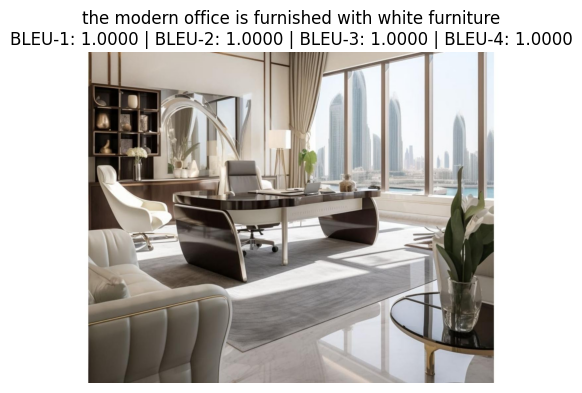

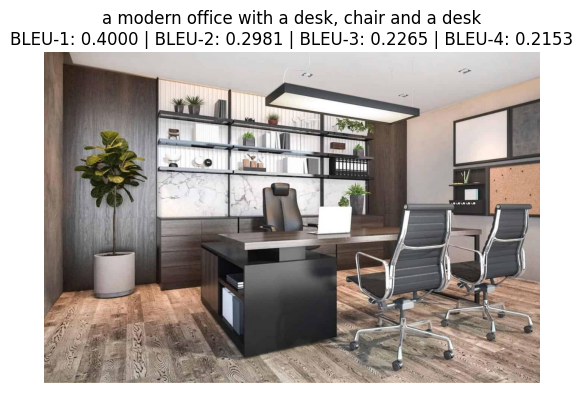

In [26]:
import matplotlib.pyplot as plt
import torch
from PIL import Image
import os
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction

smoothie = SmoothingFunction().method4

def visualize_image_with_caption(image_path, caption, bleu_scores):
    image = Image.open(image_path).convert('RGB')
    plt.imshow(image)
    plt.title(f"{caption}\nBLEU-1: {bleu_scores[0]:.4f} | BLEU-2: {bleu_scores[1]:.4f} | BLEU-3: {bleu_scores[2]:.4f} | BLEU-4: {bleu_scores[3]:.4f}")
    plt.axis('off')
    plt.show()

def generate_and_plot_captions_with_bleu(model, processor, image_dir, captions_dict, device, num_images=20):
    model.eval()
    images = list(captions_dict.keys())[:num_images]
    with torch.no_grad():
        for image_file in images:
            image_path = os.path.join(image_dir, image_file)
            reference_caption = captions_dict[image_file]

            # Load image
            image = Image.open(image_path).convert('RGB')
            pixel_values = processor(images=image, return_tensors="pt").pixel_values.to(device)

            # Generate caption
            generated_output = model.generate(pixel_values=pixel_values, max_new_tokens=64)
            generated_caption = processor.batch_decode(generated_output, skip_special_tokens=True)[0]

            # BLEU Calculation
            ref_tokens = reference_caption.lower().split()
            cand_tokens = generated_caption.lower().split()
            bleu1 = sentence_bleu([ref_tokens], cand_tokens, weights=(1, 0, 0, 0), smoothing_function=smoothie)
            bleu2 = sentence_bleu([ref_tokens], cand_tokens, weights=(0.5, 0.5, 0, 0), smoothing_function=smoothie)
            bleu3 = sentence_bleu([ref_tokens], cand_tokens, weights=(0.33, 0.33, 0.33, 0), smoothing_function=smoothie)
            bleu4 = sentence_bleu([ref_tokens], cand_tokens, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smoothie)

            # Plot image + caption + BLEU
            visualize_image_with_caption(image_path, generated_caption, (bleu1, bleu2, bleu3, bleu4))

# Set device (GPU if available, otherwise CPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Move the model to the device
finetuned_model.to(device)

# Generate and plot captions after finetuning with BLEU scores shown
print("Generating captions with finetuned model and showing BLEU scores:")
generate_and_plot_captions_with_bleu(finetuned_model, processor, image_dir, captions_dict, device)


Generating captions with finetuned model:


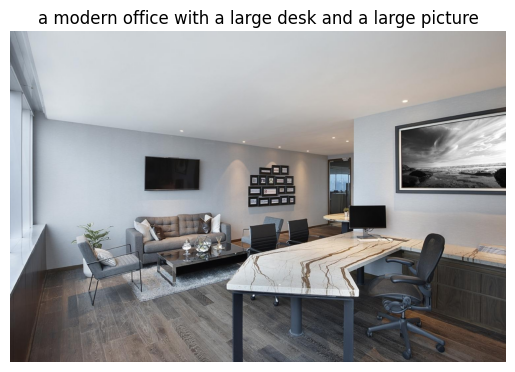

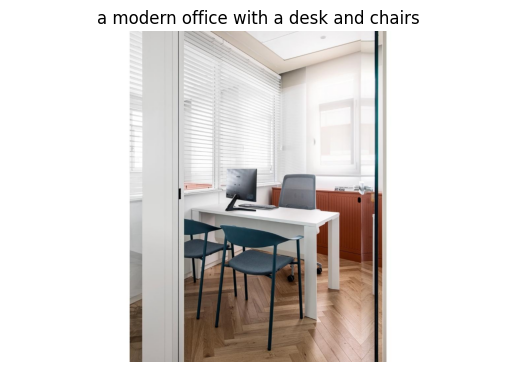

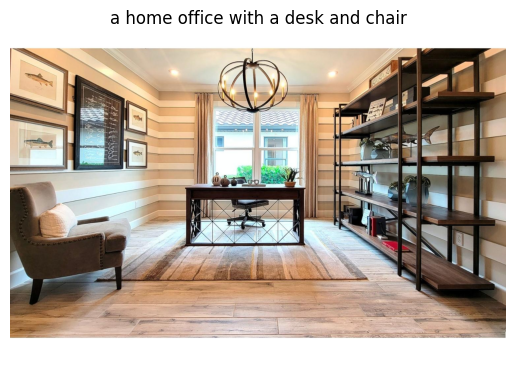

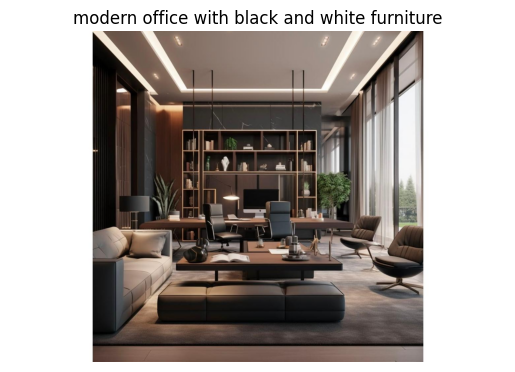

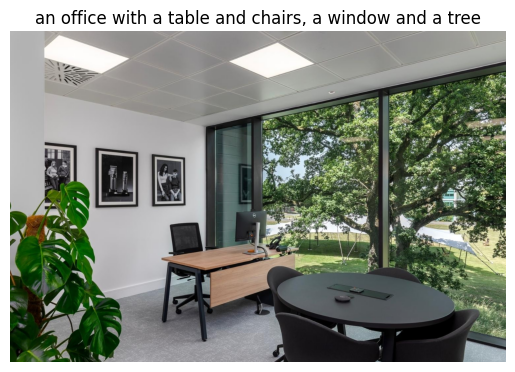

Press Enter to view next batch... 


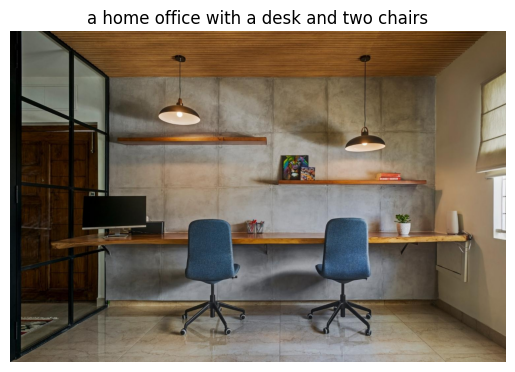

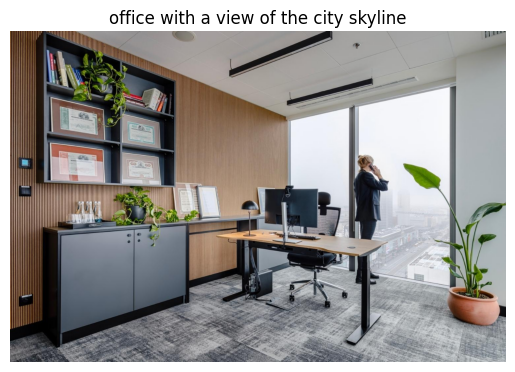

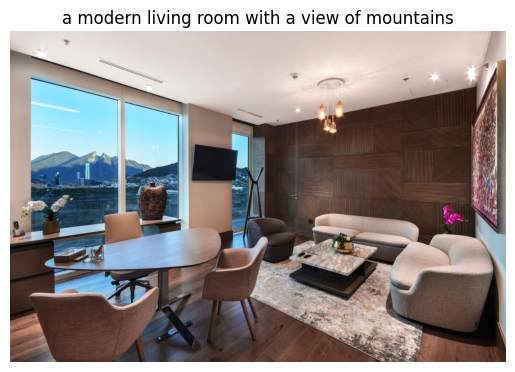

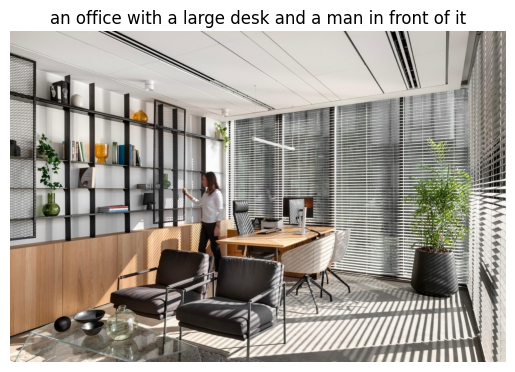

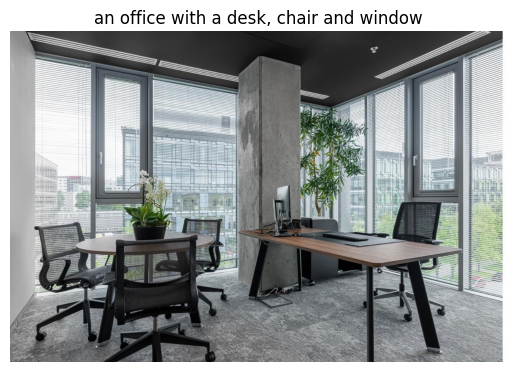

Press Enter to view next batch... 


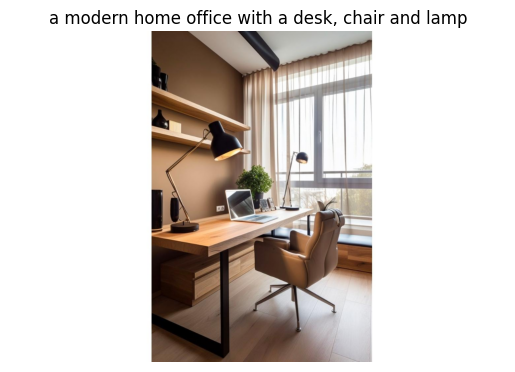

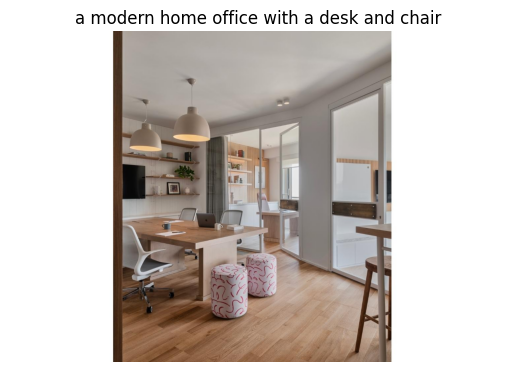

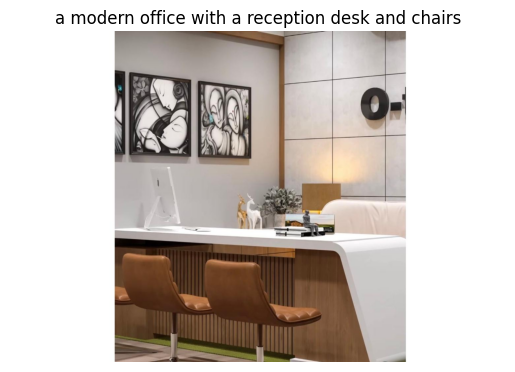

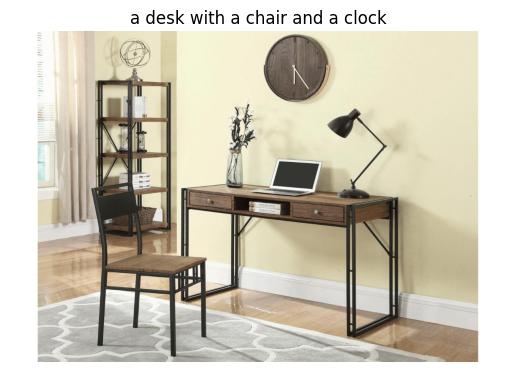

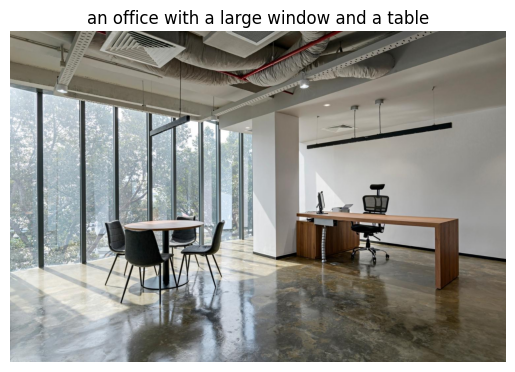

Press Enter to view next batch... 


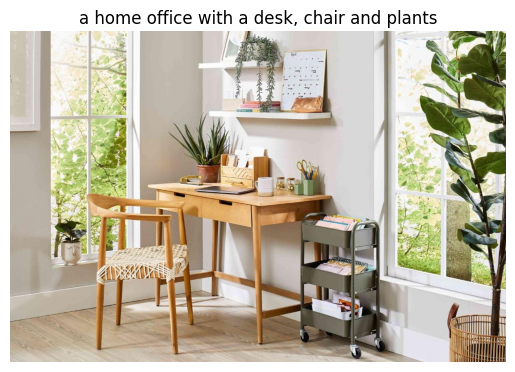

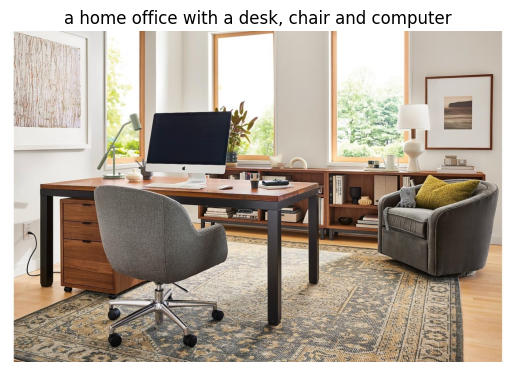

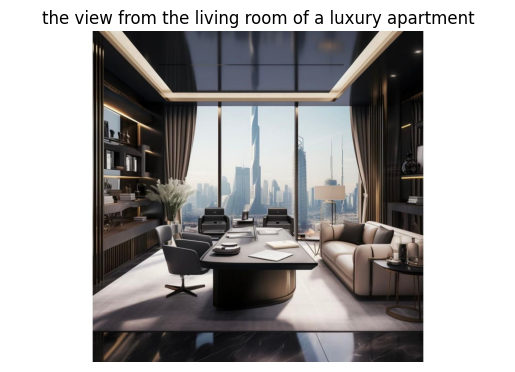

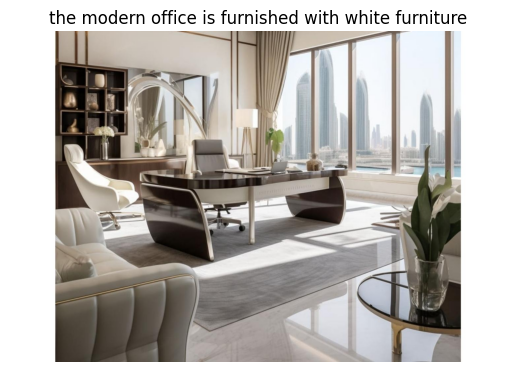

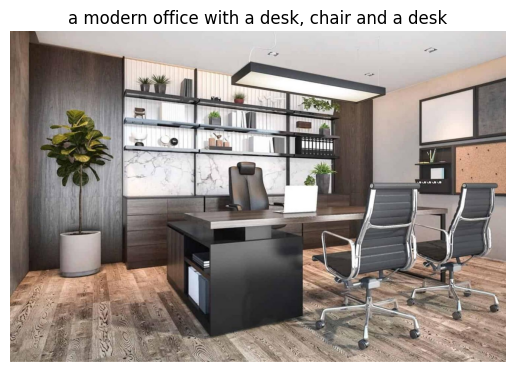

In [27]:
import matplotlib.pyplot as plt
import torch
from PIL import Image
import os

def visualize_image_with_caption(image_path, caption):
    image = Image.open(image_path).convert('RGB')
    plt.imshow(image)
    plt.title(caption)
    plt.axis('off')
    plt.show()

def generate_and_plot_captions(model, processor, image_dir, captions_dict, device, num_images=20, batch_size=5):
    model.eval()
    images = list(captions_dict.keys())[:num_images]
    
    with torch.no_grad():
        for i in range(0, len(images), batch_size):
            batch_images = images[i:i+batch_size]
            for image_file in batch_images:
                image_path = os.path.join(image_dir, image_file)
                image = Image.open(image_path).convert('RGB')
                pixel_values = processor(images=image, return_tensors="pt").pixel_values.to(device)
                generated_output = model.generate(pixel_values=pixel_values, max_new_tokens=64)
                generated_caption = processor.batch_decode(generated_output, skip_special_tokens=True)[0]
                visualize_image_with_caption(image_path, generated_caption)
            
            if i + batch_size < len(images):
                input("Press Enter to view next batch...")

# Set device (GPU if available, otherwise CPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Move the model to the device
finetuned_model.to(device)

# Generate and plot captions after finetuning (change num_images as needed)
print("Generating captions with finetuned model:")
generate_and_plot_captions(finetuned_model, processor, image_dir, captions_dict, device, num_images=20, batch_size=5)


Generating captions with finetuned model:


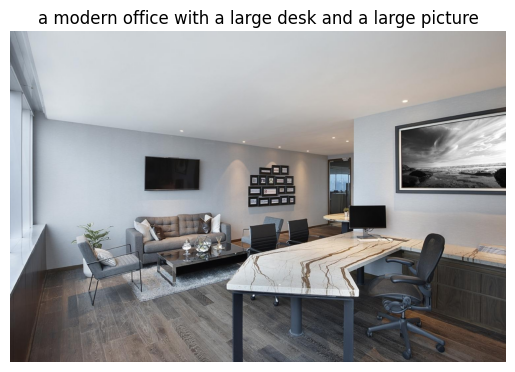

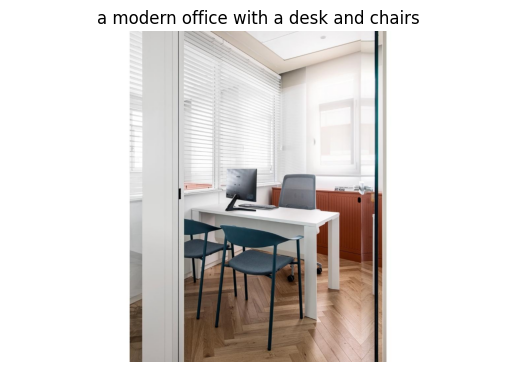

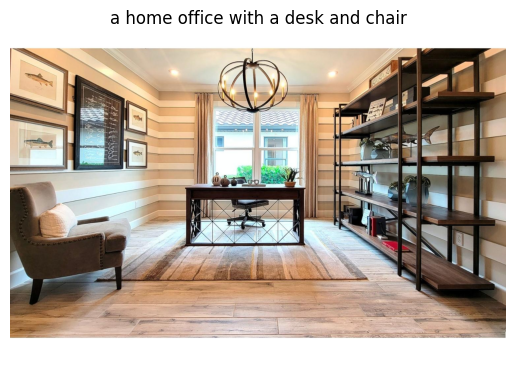

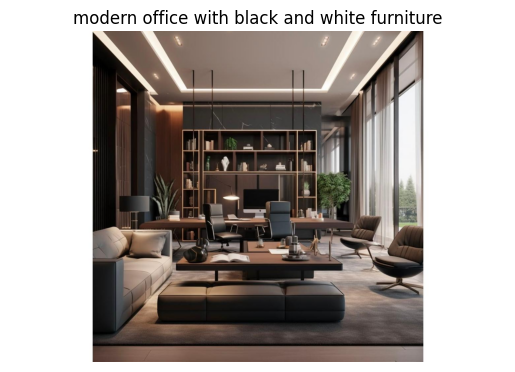

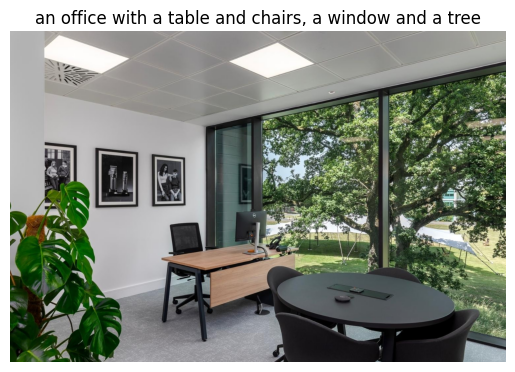

In [28]:
import matplotlib.pyplot as plt
import torch
from PIL import Image
import os

def visualize_image_with_caption(image_path, caption):
    image = Image.open(image_path).convert('RGB')
    plt.imshow(image)
    plt.title(caption)
    plt.axis('off')
    plt.show()

def generate_and_plot_captions(model, processor, image_dir, captions_dict, device, num_images=5):
    model.eval()
    images = list(captions_dict.keys())[:num_images]
    with torch.no_grad():
        for image_file in images:
            image_path = os.path.join(image_dir, image_file)
            image = Image.open(image_path).convert('RGB')
            pixel_values = processor(images=image, return_tensors="pt").pixel_values.to(device)
            generated_output = model.generate(pixel_values=pixel_values, max_new_tokens=64)
            generated_caption = processor.batch_decode(generated_output, skip_special_tokens=True)[0]
            visualize_image_with_caption(image_path, generated_caption)

# Set device (GPU if available, otherwise CPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Move the model to the device
finetuned_model.to(device)

# Generate and plot captions after finetuning
print("Generating captions with finetuned model:")
generate_and_plot_captions(finetuned_model, processor, image_dir, captions_dict, device)


100%|██████████| 179/179 [01:06<00:00,  2.67it/s]


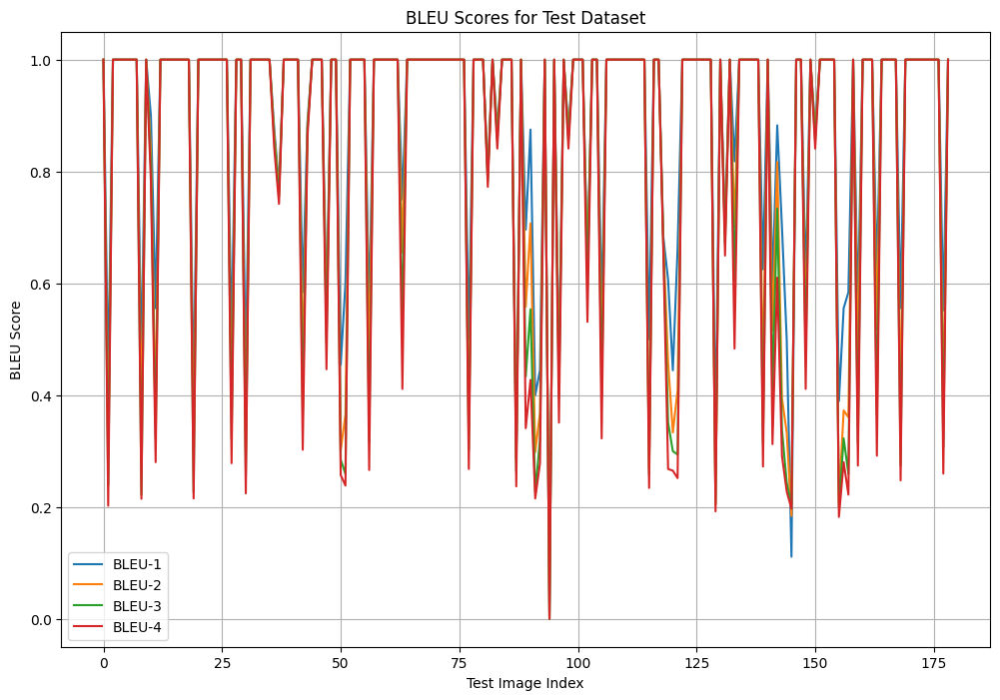

In [29]:
# Assuming you have captions_dict = {image_file: caption} from your earlier JSON load
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
import matplotlib.pyplot as plt
from tqdm import tqdm

smoothie = SmoothingFunction().method4

bleu1_scores = []
bleu2_scores = []
bleu3_scores = []
bleu4_scores = []

model.eval()
with torch.no_grad():
    for image_file, reference_caption in tqdm(captions_dict.items()):
        image_path = os.path.join(image_dir, image_file)

        # Load and preprocess image
        image = Image.open(image_path).convert("RGB")
        pixel_values = processor(images=image, return_tensors="pt").pixel_values.to(device)

        # Generate candidate caption
        generated_ids = model.generate(pixel_values=pixel_values, max_new_tokens=64)
        candidate_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]

        # BLEU preprocessing
        reference_tokens = reference_caption.lower().split()
        candidate_tokens = candidate_caption.lower().split()

        # BLEU-1 to BLEU-4
        bleu1 = sentence_bleu([reference_tokens], candidate_tokens, weights=(1, 0, 0, 0), smoothing_function=smoothie)
        bleu2 = sentence_bleu([reference_tokens], candidate_tokens, weights=(0.5, 0.5, 0, 0), smoothing_function=smoothie)
        bleu3 = sentence_bleu([reference_tokens], candidate_tokens, weights=(0.33, 0.33, 0.33, 0), smoothing_function=smoothie)
        bleu4 = sentence_bleu([reference_tokens], candidate_tokens, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smoothie)

        bleu1_scores.append(bleu1)
        bleu2_scores.append(bleu2)
        bleu3_scores.append(bleu3)
        bleu4_scores.append(bleu4)

# Plot BLEU Score Graphs
plt.figure(figsize=(12, 8))
plt.plot(bleu1_scores, label='BLEU-1')
plt.plot(bleu2_scores, label='BLEU-2')
plt.plot(bleu3_scores, label='BLEU-3')
plt.plot(bleu4_scores, label='BLEU-4')
plt.xlabel('Test Image Index')
plt.ylabel('BLEU Score')
plt.title('BLEU Scores for Test Dataset')
plt.legend()
plt.grid(True)
plt.show()


In [30]:
import numpy as np

# Convert lists to numpy arrays
bleu1_mean = np.mean(bleu1_scores)
bleu2_mean = np.mean(bleu2_scores)
bleu3_mean = np.mean(bleu3_scores)
bleu4_mean = np.mean(bleu4_scores)

print(f"Test BLEU-1 Average: {bleu1_mean:.4f}")
print(f"Test BLEU-2 Average: {bleu2_mean:.4f}")
print(f"Test BLEU-3 Average: {bleu3_mean:.4f}")
print(f"Test BLEU-4 Average: {bleu4_mean:.4f}")


Test BLEU-1 Average: 0.8802
Test BLEU-2 Average: 0.8497
Test BLEU-3 Average: 0.8328
Test BLEU-4 Average: 0.8207


In [ ]:
import matplotlib.pyplot as plt

# BLEU metrics and Train scores
bleu_labels = ["BLEU-1", "BLEU-2", "BLEU-3", "BLEU-4"]
train_scores = [0.8802, 0.8497, 0.8328, 0.8207]

# Plotting
plt.figure(figsize=(8, 5))
bars = plt.bar(bleu_labels, train_scores, color='orange', edgecolor='black')

# Annotate bars with values
for i in range(len(bleu_labels)):
    plt.text(i, train_scores[i] + 0.005, f"{train_scores[i]:.4f}", ha='center', va='bottom', fontsize=9)

# Axes and labels
plt.ylim(0, 1.0)
plt.ylabel("Score", fontsize=12)
plt.xlabel("BLEU Metric", fontsize=12)
plt.title("BLEU Scores (Train Set)", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


100%|██████████| 28/28 [00:10<00:00,  2.73it/s]


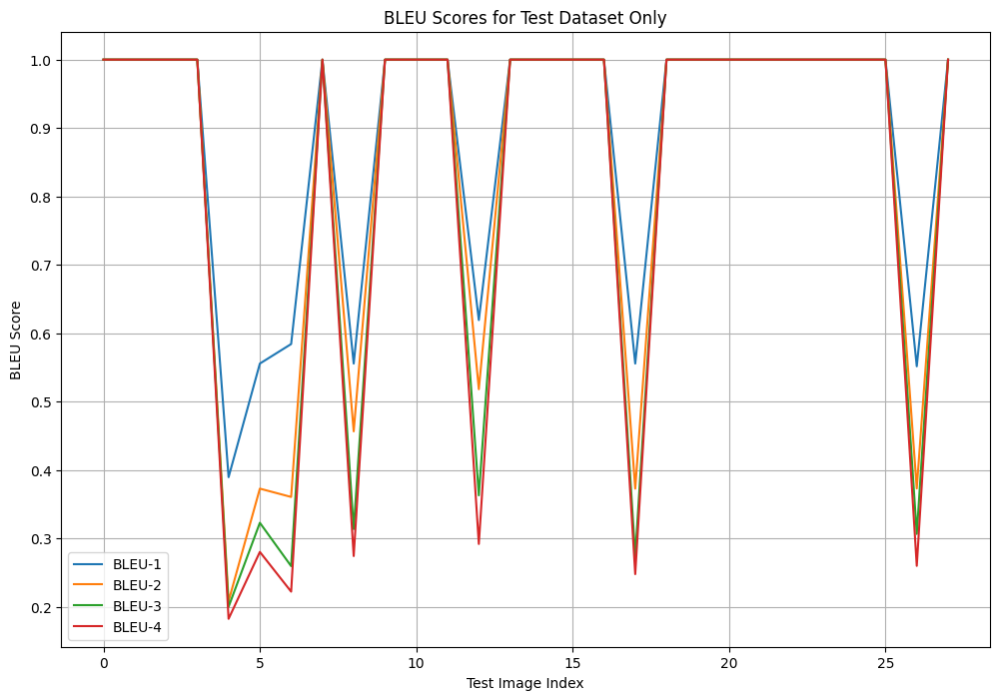

In [32]:
# Step 1: Prepare raw list of items from captions_dict
all_items = list(captions_dict.items())

# Step 2: Apply the same split ratios to raw JSON (to sync with your DataLoader split)
train_items = all_items[:train_size]
val_items = all_items[train_size:train_size + val_size]
test_items = all_items[train_size + val_size:]  # this is your test split only

# Step 3: BLEU computation ONLY on test_items
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
import matplotlib.pyplot as plt
from tqdm import tqdm

smoothie = SmoothingFunction().method4

bleu1_scores = []
bleu2_scores = []
bleu3_scores = []
bleu4_scores = []

model.eval()
with torch.no_grad():
    for image_file, reference_caption in tqdm(test_items):
        image_path = os.path.join(image_dir, image_file)

        # Load and preprocess image
        image = Image.open(image_path).convert("RGB")
        pixel_values = processor(images=image, return_tensors="pt").pixel_values.to(device)

        # Generate candidate caption
        generated_ids = model.generate(pixel_values=pixel_values, max_new_tokens=64)
        candidate_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]

        # BLEU preprocessing
        reference_tokens = reference_caption.lower().split()
        candidate_tokens = candidate_caption.lower().split()

        # BLEU-1 to BLEU-4
        bleu1 = sentence_bleu([reference_tokens], candidate_tokens, weights=(1, 0, 0, 0), smoothing_function=smoothie)
        bleu2 = sentence_bleu([reference_tokens], candidate_tokens, weights=(0.5, 0.5, 0, 0), smoothing_function=smoothie)
        bleu3 = sentence_bleu([reference_tokens], candidate_tokens, weights=(0.33, 0.33, 0.33, 0), smoothing_function=smoothie)
        bleu4 = sentence_bleu([reference_tokens], candidate_tokens, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smoothie)

        bleu1_scores.append(bleu1)
        bleu2_scores.append(bleu2)
        bleu3_scores.append(bleu3)
        bleu4_scores.append(bleu4)

# Step 4: Plot
plt.figure(figsize=(12, 8))
plt.plot(bleu1_scores, label='BLEU-1')
plt.plot(bleu2_scores, label='BLEU-2')
plt.plot(bleu3_scores, label='BLEU-3')
plt.plot(bleu4_scores, label='BLEU-4')
plt.xlabel('Test Image Index')
plt.ylabel('BLEU Score')
plt.title('BLEU Scores for Test Dataset Only')
plt.legend()
plt.grid(True)
plt.show()


In [33]:
import numpy as np

# Convert lists to numpy arrays
bleu1_mean = np.mean(bleu1_scores)
bleu2_mean = np.mean(bleu2_scores)
bleu3_mean = np.mean(bleu3_scores)
bleu4_mean = np.mean(bleu4_scores)

print(f"Test BLEU-1 Average: {bleu1_mean:.4f}")
print(f"Test BLEU-2 Average: {bleu2_mean:.4f}")
print(f"Test BLEU-3 Average: {bleu3_mean:.4f}")
print(f"Test BLEU-4 Average: {bleu4_mean:.4f}")


Test BLEU-1 Average: 0.8861
Test BLEU-2 Average: 0.8451
Test BLEU-3 Average: 0.8228
Test BLEU-4 Average: 0.8128


100%|██████████| 179/179 [01:06<00:00,  2.70it/s]


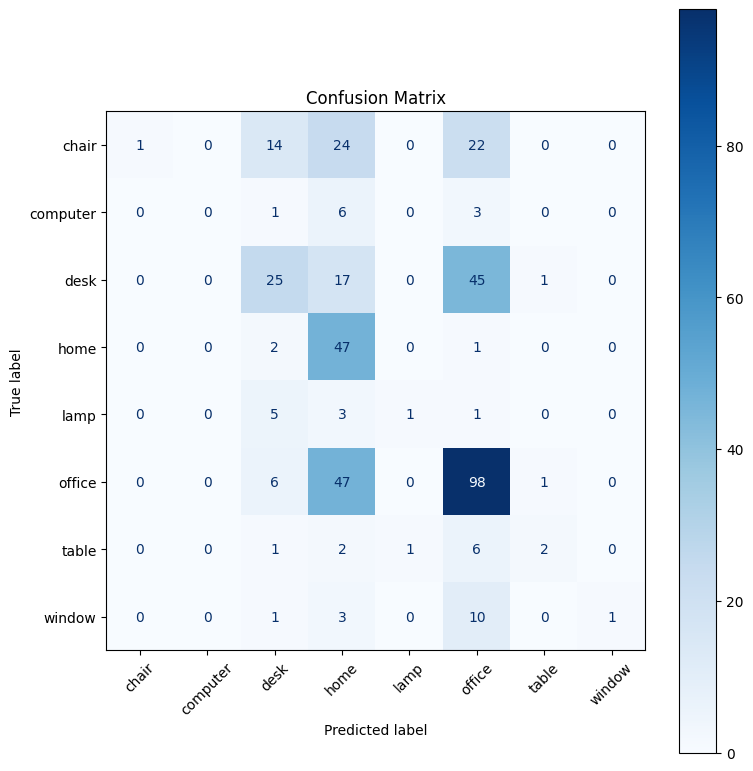

In [34]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
from PIL import Image
import torch

all_refs = []
all_preds = []

# Only use these object keywords
object_keywords = set([
    "office","desk", "chair","home", "window", "computer", "table",  "lamp"
])

# Map each object to an index for confusion matrix
vocab = sorted(object_keywords)
vocab_dict = {word: idx for idx, word in enumerate(vocab)}

def get_token_index(token):
    return vocab_dict.get(token, -1)

model.eval()
with torch.no_grad():
    for image_file, reference_caption in tqdm(captions_dict.items()):
        image_path = os.path.join(image_dir, image_file)
        image = Image.open(image_path).convert("RGB")
        pixel_values = processor(images=image, return_tensors="pt").pixel_values.to(device)

        generated_ids = model.generate(pixel_values=pixel_values, max_new_tokens=34)
        generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]

        ref_tokens = [t for t in reference_caption.lower().split() if t in vocab_dict]
        pred_tokens = [t for t in generated_caption.lower().split() if t in vocab_dict]

        # For each ground truth object, compare to predicted ones
        for ref_token in ref_tokens:
            ref_idx = get_token_index(ref_token)
            if pred_tokens:
                # Match with first found object in prediction
                pred_token = pred_tokens[0]
                pred_idx = get_token_index(pred_token)
                all_refs.append(ref_idx)
                all_preds.append(pred_idx)

# Compute confusion matrix
cm = confusion_matrix(all_refs, all_preds, labels=list(range(len(vocab))))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=vocab)

fig, ax = plt.subplots(figsize=(8, 8))
disp.plot(ax=ax, xticks_rotation=45, cmap="Blues", colorbar=True)
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()


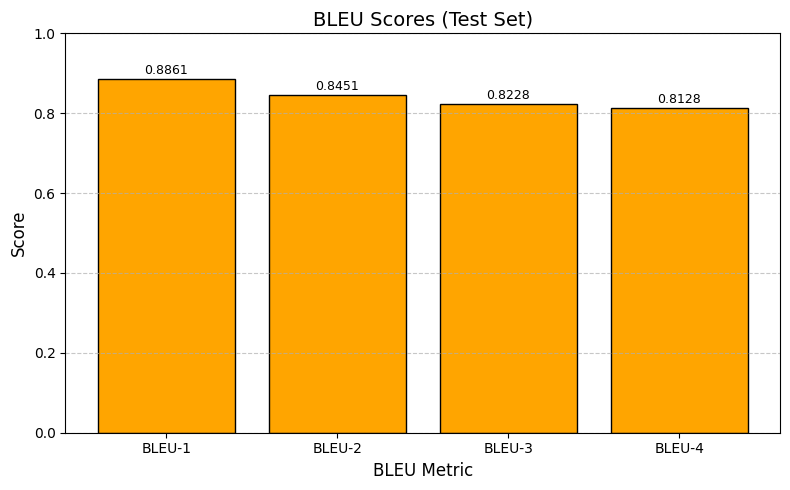

In [1]:
import matplotlib.pyplot as plt

# BLEU metrics and Train scores
bleu_labels = ["BLEU-1", "BLEU-2", "BLEU-3", "BLEU-4"]
train_scores = [0.8861,0.8451, 0.8228, 0.8128]

# Plotting
plt.figure(figsize=(8, 5))
bars = plt.bar(bleu_labels, train_scores, color='orange', edgecolor='black')

# Annotate bars with values
for i in range(len(bleu_labels)):
    plt.text(i, train_scores[i] + 0.005, f"{train_scores[i]:.4f}", ha='center', va='bottom', fontsize=9)

# Axes and labels
plt.ylim(0, 1.0)
plt.ylabel("Score", fontsize=12)
plt.xlabel("BLEU Metric", fontsize=12)
plt.title("BLEU Scores (Test Set)", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


100%|██████████| 179/179 [01:06<00:00,  2.71it/s]


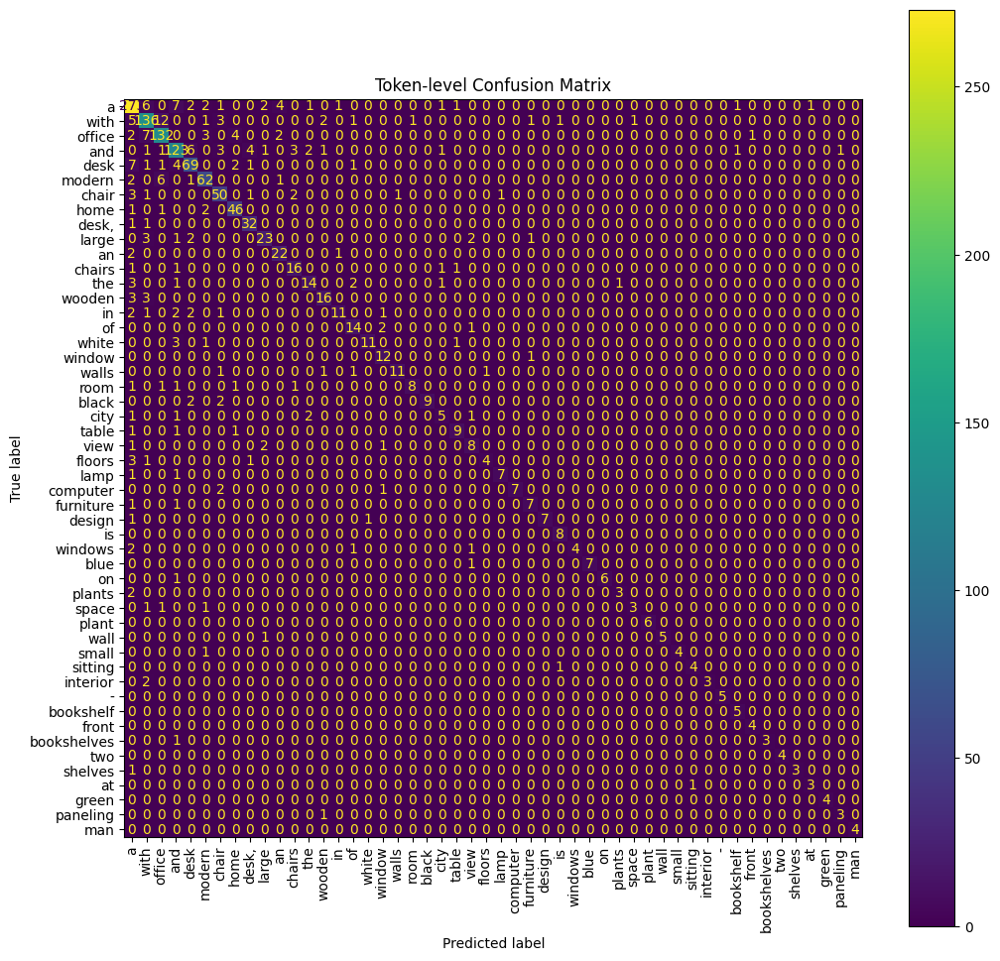

In [36]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from collections import Counter
import numpy as np
import torch
from tqdm import tqdm
from PIL import Image
import os
import matplotlib.pyplot as plt

# Collect all references and predictions
all_refs = []
all_preds = []

# Limit vocabulary to top-K for clearer matrix
vocab_counter = Counter()

# First pass to build vocabulary (optional)
for caption in captions_dict.values():
    vocab_counter.update(caption.lower().split())

# Keep only most common N tokens
top_k = 50
vocab = [word for word, _ in vocab_counter.most_common(top_k)]
vocab_dict = {word: idx for idx, word in enumerate(vocab)}

def get_token_index(token):
    return vocab_dict.get(token, -1)  # -1 = "unknown" token

# Evaluate the model and collect references and predictions
model.eval()
with torch.no_grad():
    for image_file, reference_caption in tqdm(captions_dict.items()):
        image_path = os.path.join(image_dir, image_file)
        image = Image.open(image_path).convert("RGB")
        pixel_values = processor(images=image, return_tensors="pt").pixel_values.to(device)
        
        # Generate caption from image
        generated_ids = model.generate(pixel_values=pixel_values, max_new_tokens=34)
        generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
        
        # Tokenize reference and prediction captions
        ref_tokens = reference_caption.lower().split()
        pred_tokens = generated_caption.lower().split()

        # Truncate or pad for comparison (to same length)
        max_len = min(len(ref_tokens), len(pred_tokens))
        for i in range(max_len):
            ref_idx = get_token_index(ref_tokens[i])
            pred_idx = get_token_index(pred_tokens[i])
            
            # Only add valid tokens to the confusion matrix
            if ref_idx != -1 and pred_idx != -1:
                all_refs.append(ref_idx)
                all_preds.append(pred_idx)

# Compute confusion matrix
cm = confusion_matrix(all_refs, all_preds, labels=list(range(len(vocab))))

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=vocab)
fig, ax = plt.subplots(figsize=(12, 12))
disp.plot(ax=ax, xticks_rotation=90)
plt.title("Token-level Confusion Matrix")
plt.show()


In [38]:
import torch
from parler_tts import ParlerTTSForConditionalGeneration, ParlerTTSStreamer
from transformers import AutoTokenizer
from threading import Thread
import soundfile as sf

In [ ]:
import torch
from transformers import AutoTokenizer
from parler_tts import ParlerTTSForConditionalGeneration
from IPython.display import Audio

# 1. Initialize device and model
torch_device = "cuda" if torch.cuda.is_available() else "cpu"
model_name = "parler-tts/parler-tts-mini-expresso"

try:
    # 2. Load tokenizer and model
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = ParlerTTSForConditionalGeneration.from_pretrained(model_name).to(torch_device)
    
    # 3. Prepare inputs
    prompt = "As the golden hues of sunset bathed the conference room, the CEO stood before the gathered executives with visible tension in his posture. The weight of unspoken challenges lingered in the air as investors exchanged nervous glances. Though his voice remained steady, the faint crease between his brows betrayed his concern. Yet, beneath the surface of every anxious expression in the room, there was an unshaken trust—a collective understanding that this leader had guided them through storms before. The fading light through the windows seemed to mirror the company's current crossroads: an ending daylight, but with the promise that even the darkest boardroom nights eventually give way to new strategies at dawn."
    description = "A female speaker delivers a slightly expressive and animated speech with a moderate speed and pitch. The recording is of very high quality, with the speaker's voice sounding clear and very close up."
    
    # 4. Generate audio
    input_ids = tokenizer(description, return_tensors="pt").input_ids.to(torch_device)
    prompt_input_ids = tokenizer(prompt, return_tensors="pt").input_ids.to(torch_device)
    
    generation = model.generate(input_ids=input_ids, prompt_input_ids=prompt_input_ids)
    audio_arr = generation.cpu().float().numpy().squeeze()
    
    # 5. Play audio
    display(Audio(audio_arr, rate=model.config.sampling_rate))
    
except Exception as e:
    print(f"Error: {e}")
    print("Note: You may need to request access to this model at:")
    print("https://huggingface.co/parler-tts/parler-tts-mini-expresso")

tokenizer_config.json:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.54k [00:00<?, ?B/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


config.json:   0%|          | 0.00/7.45k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.59G [00:00<?, ?B/s]

In [ ]:
import pyttsx3

engine = pyttsx3.init()

def set_rate(rate=200):
    engine.setProperty('rate', rate)

def set_volume(volume=1.0):
    engine.setProperty('volume', volume)

def set_gender(gender='male'):
    voices = engine.getProperty('voices')
    
    if gender == 'female':
        engine.setProperty('voice', voices[1].id)  # female voice
    else:
        engine.setProperty('voice', voices[0].id)  # male voice


set_rate(150)        
set_volume(0.9)       
set_gender('female')  

engine.save_to_file("an office with a table and chairs, a window and a tree", 'output_audio.wav')
engine.runAndWait()

In [2]:
from TTS.api import TTS
import torch
import scipy.io.wavfile as wav

# 1. Initialize device
device = "cuda" if torch.cuda.is_available() else "cpu"

# 2. Initialize TTS with the XTTS model
# Note: Replace the model path with the actual downloaded checkpoint or use a pre-trained model name
model_name = "tts_models/multilingual/multi-dataset/xtts_v2"  # Pre-trained model name
tts = TTS(model_name).to(device)

# 3. Prepare input text
text = "an office with a table and chairs, a window and a tree"
speaker_wav = "path_to_reference_audio.wav"  # Path to a reference audio file for voice cloning (optional)
language = "en"  # Language code (e.g., "en" for English)

try:
    # 4. Generate audio
    # If using voice cloning, provide the speaker_wav; otherwise, omit the speaker_wav parameter
    if speaker_wav:
        wav_output = tts.tts(text=text, speaker_wav=speaker_wav, language=language)
    else:
        wav_output = tts.tts(text=text, language=language)
    
    # 5. Save audio to file
    sample_rate = tts.output_sample_rate
    wav.write("output_audio.wav", sample_rate, wav_output.astype(np.int16))
    
    print("Audio saved as 'output_audio.wav'")

except Exception as e:
    print(f"Error: {e}")
    print("Note: Ensure the TTS model is downloaded and the path to speaker_wav (if used) is correct.")
    print("Download models from: https://github.com/coqui-ai/TTS#pretrained-models")


 > You must confirm the following:
 | > "I have purchased a commercial license from Coqui: licensing@coqui.ai"
 | > "Otherwise, I agree to the terms of the non-commercial CPML: https://coqui.ai/cpml" - [y/n]


 | | >  y


 > Downloading model to /root/.local/share/tts/tts_models--multilingual--multi-dataset--xtts_v2


100%|█████████▉| 1.86G/1.87G [00:20<00:00, 93.9MiB/s]
100%|██████████| 1.87G/1.87G [00:20<00:00, 91.4MiB/s]
100%|██████████| 4.37k/4.37k [00:00<00:00, 26.7kiB/s]
 75%|███████▌  | 271k/361k [00:00<00:00, 1.69MiB/s]
100%|██████████| 361k/361k [00:00<00:00, 1.15MiB/s]
100%|██████████| 32.0/32.0 [00:00<00:00, 171iB/s]


 > Model's license - CPML
 > Check https://coqui.ai/cpml.txt for more info.
 > Using model: xtts


/usr/local/lib/python3.10/dist-packages/TTS/tts/layers/xtts/xtts_manager.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.speakers = torch.load(speaker_file_path)
/u

 > Text splitted to sentences.
['an office with a table and chairs, a window and a tree']
Error: Failed to open the input "path_to_reference_audio.wav" (No such file or directory).
Exception raised from get_input_format_context at /__w/audio/audio/pytorch/audio/src/libtorio/ffmpeg/stream_reader/stream_reader.cpp:42 (most recent call first):
frame #0: c10::Error::Error(c10::SourceLocation, std::string) + 0x96 (0x7fd5c9f49446 in /usr/local/lib/python3.10/dist-packages/torch/lib/libc10.so)
frame #1: c10::detail::torchCheckFail(char const*, char const*, unsigned int, std::string const&) + 0x64 (0x7fd5c9ef36e4 in /usr/local/lib/python3.10/dist-packages/torch/lib/libc10.so)
frame #2: <unknown function> + 0x42134 (0x7fd57a269134 in /usr/local/lib/python3.10/dist-packages/torio/lib/libtorio_ffmpeg4.so)
frame #3: torio::io::StreamingMediaDecoder::StreamingMediaDecoder(std::string const&, std::optional<std::string> const&, std::optional<std::map<std::string, std::string, std::less<std::string>, 

In [7]:
from gtts import gTTS
import os

# Text to be converted to speech
text = "an office with a table and chairs, a window and a tree"

# Language (English)
language = 'en'

# Create a gTTS object
tts = gTTS(text=text, lang=language, slow=False)

# Save the audio file
output_file = "output_audio.wav"
tts.save(output_file)

# Play the audio (optional, requires `playsound` or `os.system`)
try:
    # For Windows/macOS/Linux (if `playsound` is installed)
    from playsound import playsound
    playsound(output_file)
except:
    # Fallback for Linux (requires `mpg123` or similar)
    os.system(f"start {output_file}")  # Windows
    # os.system(f"mpg123 {output_file}")  # Linux
    # os.system(f"afplay {output_file}")  # macOS

print(f"Audio saved as: {output_file}")

Audio saved as: output_audio.wav
